### Relative performance for Temperature

/tmp/ipykernel_251984/3231286780.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xgb_day['rmse_norm'] = (xgb_day['rmse'] - xgb_day['rmse'].min()) / (xgb_day['rmse'].max() - xgb_day['rmse'].min())
/tmp/ipykernel_251984/3231286780.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conv_day['rmse_norm'] = (conv_day['rmse_t2m'] - conv_day['rmse_t2m'].min()) / (conv_day['rmse_t2m'].max() - conv_day['rmse_t2m'].min())


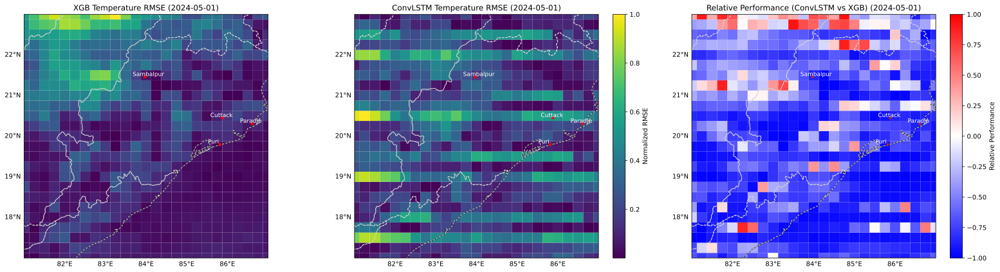

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load RMSE files
# --------------------------
xgb_metrics = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_daily_grid_metrics.parquet')
conv_metrics = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_t2m_daily_grid_metrics.parquet')

# --------------------------
# 2. Select day
# --------------------------
day = '2024-05-01'
xgb_day = xgb_metrics[xgb_metrics['date'] == day]
conv_day = conv_metrics[conv_metrics['date'] == day]

# --------------------------
# 3. Merge on lat/lon for relative performance
# --------------------------
merged = pd.merge(
    xgb_day[['latitude', 'longitude', 'rmse']],
    conv_day[['latitude', 'longitude', 'rmse_t2m']],
    on=['latitude','longitude'],
    how='inner'
)
merged['rel_perf'] = (merged['rmse'] - merged['rmse_t2m']) / (merged['rmse'] + merged['rmse_t2m'])

# --------------------------
# 4. Normalize RMSE for visualization
# --------------------------
xgb_day['rmse_norm'] = (xgb_day['rmse'] - xgb_day['rmse'].min()) / (xgb_day['rmse'].max() - xgb_day['rmse'].min())
conv_day['rmse_norm'] = (conv_day['rmse_t2m'] - conv_day['rmse_t2m'].min()) / (conv_day['rmse_t2m'].max() - conv_day['rmse_t2m'].min())

# --------------------------
# 5. Grid creation function
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=81, lon_max=87):
    df = df[(df['latitude'] >= lat_min) & (df['latitude'] <= lat_max) &
            (df['longitude'] >= lon_min) & (df['longitude'] <= lon_max)]
    
    lats = np.sort(df['latitude'].unique())
    lons = np.sort(df['longitude'].unique())
    grid = np.full((len(lats), len(lons)), np.nan)
    
    for i, lat in enumerate(lats):
        for j, lon in enumerate(lons):
            val = df[(df['latitude'] == lat) & (df['longitude'] == lon)][metric].values
            if len(val) > 0:
                grid[i, j] = val[0]
    return lats, lons, grid

# --------------------------
# 6. Plot side-by-side with outside colorbars
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(22,6), subplot_kw={'projection': ccrs.PlateCarree()})
cities = {
    "Cuttack": (20.46, 85.88),      
    "Paradip": (20.32, 86.61),      
    "Puri": (19.81, 85.82),         
    "Sambalpur": (21.47, 83.97)     
}

# --- XGB normalized RMSE
ax = axes[0]
lats, lons, grid = create_grid(xgb_day, 'rmse_norm')
mesh1 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='viridis', transform=ccrs.PlateCarree())
ax.set_title(f"XGB Temperature RMSE ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (xgb_day['latitude'] - lat)**2 + (xgb_day['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='red', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='white', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
#cbar1 = fig.colorbar(mesh1, ax=ax, orientation='vertical', pad=0.02, fraction=0.05)
#cbar1.set_label('Normalized RMSE')

# --- ConvLSTM normalized RMSE
ax = axes[1]
lats, lons, grid = create_grid(conv_day, 'rmse_norm')
mesh2 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='viridis', transform=ccrs.PlateCarree())
ax.set_title(f"ConvLSTM Temperature RMSE ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (conv_day['latitude'] - lat)**2 + (conv_day['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='red', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='white', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
cbar2 = fig.colorbar(mesh2, ax=ax, orientation='vertical', pad=0.05, fraction=0.05)
cbar2.set_label('Normalized RMSE')

# --- Relative performance
ax = axes[2]
lats, lons, grid = create_grid(merged, 'rel_perf')
mesh3 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='bwr', vmin=-1, vmax=1, transform=ccrs.PlateCarree())
ax.set_title(f"Relative Performance (ConvLSTM vs XGB) ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (merged['latitude'] - lat)**2 + (merged['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='brown', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='white', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
cbar3 = fig.colorbar(mesh3, ax=ax, orientation='vertical', pad=0.05, fraction=0.05)
cbar3.set_label('Relative Performance')

plt.tight_layout()
save_path = '/vol/sandeep_storage/Files2/catastrophe/t2m_rmse_xgb_vs_convlstm_2024_05_01_relative.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()


---

### Precipitation

/tmp/ipykernel_251984/1654501867.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xgb_day['rmse_norm'] = (xgb_day['rmse_tp'] - xgb_day['rmse_tp'].min()) / (xgb_day['rmse_tp'].max() - xgb_day['rmse_tp'].min())
/tmp/ipykernel_251984/1654501867.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  conv_day['rmse_norm'] = (conv_day['rmse_tp_conv'] - conv_day['rmse_tp_conv'].min()) / (conv_day['rmse_tp_conv'].max() - conv_day['rmse_tp_conv'].min())


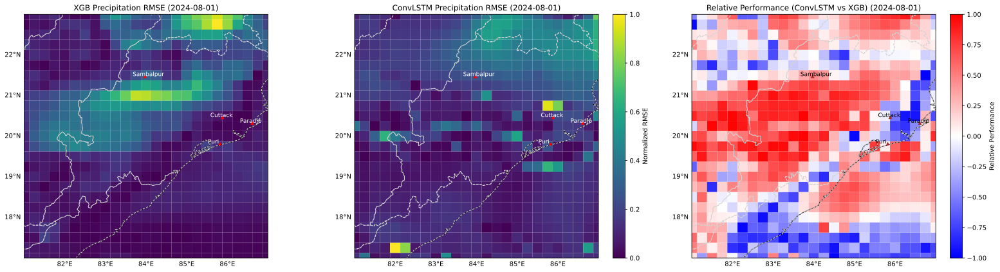

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load RMSE files
# --------------------------
xgb_metrics = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_daily_grid_metrics.parquet')
conv_metrics = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_tp_daily_grid_metrics.parquet')

# --------------------------
# 2. Select day
# --------------------------
day = '2024-08-01'
xgb_day = xgb_metrics[xgb_metrics['date'] == day]
conv_day = conv_metrics[conv_metrics['date'] == day]

# --------------------------
# 3. Merge on lat/lon for relative performance
# --------------------------
merged = pd.merge(
    xgb_day[['latitude', 'longitude', 'rmse_tp']],
    conv_day[['latitude', 'longitude', 'rmse_tp_conv']],
    on=['latitude','longitude'],
    how='inner'
)
merged['rel_perf'] = (merged['rmse_tp'] - merged['rmse_tp_conv']) / (merged['rmse_tp'] + merged['rmse_tp_conv'])

# --------------------------
# 4. Normalize RMSE for visualization
# --------------------------
xgb_day['rmse_norm'] = (xgb_day['rmse_tp'] - xgb_day['rmse_tp'].min()) / (xgb_day['rmse_tp'].max() - xgb_day['rmse_tp'].min())
conv_day['rmse_norm'] = (conv_day['rmse_tp_conv'] - conv_day['rmse_tp_conv'].min()) / (conv_day['rmse_tp_conv'].max() - conv_day['rmse_tp_conv'].min())

# --------------------------
# 5. Grid creation function
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=81, lon_max=87):
    df = df[(df['latitude'] >= lat_min) & (df['latitude'] <= lat_max) &
            (df['longitude'] >= lon_min) & (df['longitude'] <= lon_max)]
    
    lats = np.sort(df['latitude'].unique())
    lons = np.sort(df['longitude'].unique())
    grid = np.full((len(lats), len(lons)), np.nan)
    
    for i, lat in enumerate(lats):
        for j, lon in enumerate(lons):
            val = df[(df['latitude'] == lat) & (df['longitude'] == lon)][metric].values
            if len(val) > 0:
                grid[i, j] = val[0]
    return lats, lons, grid

# --------------------------
# 6. Plot side-by-side with outside colorbars
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(22,6), subplot_kw={'projection': ccrs.PlateCarree()})
cities = {
    "Cuttack": (20.46, 85.88),      
    "Paradip": (20.32, 86.61),      
    "Puri": (19.81, 85.82),         
    "Sambalpur": (21.47, 83.97)     
}

# --- XGB normalized RMSE
ax = axes[0]
lats, lons, grid = create_grid(xgb_day, 'rmse_norm')
mesh1 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='viridis', transform=ccrs.PlateCarree())
ax.set_title(f"XGB Precipitation RMSE ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (xgb_day['latitude'] - lat)**2 + (xgb_day['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='red', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='white', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
#cbar1 = fig.colorbar(mesh1, ax=ax, orientation='vertical', pad=0.02, fraction=0.05)
#cbar1.set_label('Normalized RMSE')

# --- ConvLSTM normalized RMSE
ax = axes[1]
lats, lons, grid = create_grid(conv_day, 'rmse_norm')
mesh2 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='viridis', transform=ccrs.PlateCarree())
ax.set_title(f"ConvLSTM Precipitation RMSE ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (conv_day['latitude'] - lat)**2 + (conv_day['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='red', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='white', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
cbar2 = fig.colorbar(mesh2, ax=ax, orientation='vertical', pad=0.05, fraction=0.05)
cbar2.set_label('Normalized RMSE')

# --- Relative performance
ax = axes[2]
lats, lons, grid = create_grid(merged, 'rel_perf')
mesh3 = ax.pcolormesh(lons, lats, grid, shading='auto', cmap='bwr', vmin=-1, vmax=1, transform=ccrs.PlateCarree())
ax.set_title(f"Relative Performance (ConvLSTM vs XGB) ({day})", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale('10m'))
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', linewidth=1.5)
ax.add_feature(cfeature.STATES.with_scale('10m'), linestyle='--', edgecolor='lightgrey')
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
for city, (lat, lon) in cities.items():
    distances = (merged['latitude'] - lat)**2 + (merged['longitude'] - lon)**2
    if distances.min() < 1.0:
        ax.plot(lon, lat, marker='^', color='brown', markersize=4, transform=ccrs.PlateCarree())
        ax.text(lon-0.3, lat+0.01, city, color='black', fontsize=9, transform=ccrs.PlateCarree())
# Colorbar outside
cbar3 = fig.colorbar(mesh3, ax=ax, orientation='vertical', pad=0.05, fraction=0.05)
cbar3.set_label('Relative Performance')

plt.tight_layout()
save_path = '/vol/sandeep_storage/Files2/catastrophe/tp_rmse_xgb_vs_convlstm_2024_08_01_relative.png'
plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()


---

### forecast 1 jan 2025 temp using ConvLSTM

In [18]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn

# -----------------------------
# Load full dataset
# -----------------------------
df = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/era5_temp_precip_daily_2020_2024.parquet')
df["valid_time"] = pd.to_datetime(df["valid_time"])

# -----------------------------
# Recompute normalization (SAME AS TRAINING)
# -----------------------------
t2m_mean = df['t2m'].mean()
t2m_std  = df['t2m'].std()

# -----------------------------
# Extract last 7 days of 2024
# -----------------------------
last7 = df[df["valid_time"] >= pd.Timestamp("2024-12-25")].sort_values(
            ["valid_time","latitude","longitude"]
        )

assert len(last7["valid_time"].unique()) == 7, "Need exactly 7 days!"

# -----------------------------
# Normalize t2m exactly as training
# -----------------------------
last7["t2m_norm"] = (last7["t2m"] - t2m_mean) / t2m_std

# -----------------------------
# Prepare grid structure
# -----------------------------
latitudes = np.sort(df["latitude"].unique())
longitudes = np.sort(df["longitude"].unique())
n_lat, n_lon = len(latitudes), len(longitudes)

# Pivot into (timesteps, lat, lon)
pivot_list = []
for dt in sorted(last7["valid_time"].unique()):
    grid = last7[last7["valid_time"] == dt].pivot(
                index="latitude", columns="longitude", values="t2m_norm"
            ).values
    pivot_list.append(grid)

X_input = np.stack(pivot_list, axis=0)   # (7, lat, lon)
X_input = X_input.reshape(1, 7, 1, n_lat, n_lon)  # add batch & channel dims
X_input = torch.tensor(X_input, dtype=torch.float32)

# -----------------------------
# Load the trained ConvLSTM
# -----------------------------
class ConvLSTMBlock(nn.Module):
    def __init__(self, in_ch=1, hidden_ch=16, kernel_size=3):
        super().__init__()
        self.conv = nn.Conv2d(in_ch + hidden_ch, hidden_ch, kernel_size, padding=1)
        self.hidden_ch = hidden_ch

    def forward(self, x, h):
        combined = torch.cat([x, h], dim=1)
        h_new = torch.tanh(self.conv(combined))
        return h_new

class ConvLSTM(nn.Module):
    def __init__(self, in_ch=1, hidden_ch=16, kernel_size=3, out_ch=1):
        super().__init__()
        self.hidden_ch = hidden_ch
        self.block = ConvLSTMBlock(in_ch, hidden_ch, kernel_size)
        self.out_conv = nn.Conv2d(hidden_ch, out_ch, kernel_size=1)
        
    def forward(self, x_seq):
        b, t, c, h, w = x_seq.shape
        h_t = torch.zeros(b, self.hidden_ch, h, w).to(x_seq.device)
        for ti in range(t):
            h_t = self.block(x_seq[:,ti], h_t)
        return self.out_conv(h_t)

device = "cuda" if torch.cuda.is_available() else "cpu"
model = ConvLSTM().to(device)

model.load_state_dict(torch.load(
    "/vol/sandeep_storage/Files2/catastrophe/convlstm/best_model_t2m.pth",
    map_location=device
))
model.eval()

# -----------------------------
# Predict 1 Jan 2025 (normalized)
# -----------------------------
with torch.no_grad():
    pred_norm = model(X_input.to(device)).cpu().numpy()[0,0]

# -----------------------------
# Unnormalize to °C
# -----------------------------
pred_t2m = pred_norm * t2m_std + t2m_mean

# -----------------------------
# Save predictions
# -----------------------------
records = []
for i, lat in enumerate(latitudes):
    for j, lon in enumerate(longitudes):
        records.append({
            "date": "2025-01-01",
            "latitude": lat,
            "longitude": lon,
            "t2m_pred_conv": float(pred_t2m[i,j])
        })

pred_df = pd.DataFrame(records)
pred_df.to_parquet("/vol/sandeep_storage/Files2/catastrophe/convlstm_t2m_forecast_2025_01_01.parquet", index=False)

print("Forecast saved to convlstm_t2m_forecast_2025_01_01.parquet")


Forecast saved to convlstm_t2m_forecast_2025_01_01.parquet


In [27]:
conv_forecast=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_t2m_forecast_2025_01_01.parquet')
conv_forecast


,date,latitude,longitude,t2m_pred_conv
0,2025-01-01,17.0,75.00,25.415018
1,2025-01-01,17.0,75.25,25.493271
2,2025-01-01,17.0,75.50,25.603771
3,2025-01-01,17.0,75.75,25.865805
4,2025-01-01,17.0,76.00,26.066429
...,...,...,...,...
1520,2025-01-01,23.0,89.00,18.406113
1521,2025-01-01,23.0,89.25,18.469585
1522,2025-01-01,23.0,89.50,18.538864
1523,2025-01-01,23.0,89.75,18.569622


###  forecast tp on 1 jan 2025 using ConvLSTM

In [9]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn

# -----------------------------
# Load full dataset
# -----------------------------
df = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/era5_temp_precip_daily_2020_2024.parquet')
df["valid_time"] = pd.to_datetime(df["valid_time"])

# -----------------------------
# Recompute normalization (SAME AS TRAINING)
# -----------------------------
tp_mean = df['tp'].mean()
tp_std  = df['tp'].std()

# -----------------------------
# Extract last 7 days of 2024
# -----------------------------
last7 = df[df["valid_time"] >= pd.Timestamp("2024-12-25")].sort_values(
            ["valid_time","latitude","longitude"]
        )

assert len(last7["valid_time"].unique()) == 7, "Need exactly 7 days!"

# -----------------------------
# Normalize tp exactly as training
# -----------------------------
last7["tp_norm"] = (last7["tp"] - tp_mean) / tp_std

# -----------------------------
# Prepare grid structure
# -----------------------------
latitudes = np.sort(df["latitude"].unique())
longitudes = np.sort(df["longitude"].unique())
n_lat, n_lon = len(latitudes), len(longitudes)

# Pivot into (timesteps, lat, lon)
pivot_list = []
for dt in sorted(last7["valid_time"].unique()):
    grid = last7[last7["valid_time"] == dt].pivot(
                index="latitude", columns="longitude", values="tp_norm"
            ).values
    pivot_list.append(grid)

X_input = np.stack(pivot_list, axis=0)   # (7, lat, lon)
X_input = X_input.reshape(1, 7, 1, n_lat, n_lon)  # add batch & channel dims
X_input = torch.tensor(X_input, dtype=torch.float32)

# -----------------------------
# Load the trained ConvLSTM
# -----------------------------
class ConvLSTMBlock(nn.Module):
    def __init__(self, in_ch=1, hidden_ch=16, kernel_size=3):
        super().__init__()
        self.conv = nn.Conv2d(in_ch + hidden_ch, hidden_ch, kernel_size, padding=1)
        self.hidden_ch = hidden_ch

    def forward(self, x, h):
        combined = torch.cat([x, h], dim=1)
        h_new = torch.tanh(self.conv(combined))
        return h_new

class ConvLSTM(nn.Module):
    def __init__(self, in_ch=1, hidden_ch=16, kernel_size=3, out_ch=1):
        super().__init__()
        self.hidden_ch = hidden_ch
        self.block = ConvLSTMBlock(in_ch, hidden_ch, kernel_size)
        self.out_conv = nn.Conv2d(hidden_ch, out_ch, kernel_size=1)
        
    def forward(self, x_seq):
        b, t, c, h, w = x_seq.shape
        h_t = torch.zeros(b, self.hidden_ch, h, w).to(x_seq.device)
        for ti in range(t):
            h_t = self.block(x_seq[:,ti], h_t)
        return self.out_conv(h_t)

device = "cuda" if torch.cuda.is_available() else "cpu"
model = ConvLSTM().to(device)

model.load_state_dict(torch.load(
    "/vol/sandeep_storage/Files2/catastrophe/convlstm/best_model_tp.pth",
    map_location=device
))
model.eval()

# -----------------------------
# Predict 1 Jan 2025 (normalized)
# -----------------------------
with torch.no_grad():
    pred_norm = model(X_input.to(device)).cpu().numpy()[0,0]

# -----------------------------
# Unnormalize to °C
# -----------------------------
pred_tp = pred_norm * tp_std + tp_mean

# -----------------------------
# Save predictions
# -----------------------------
records = []
for i, lat in enumerate(latitudes):
    for j, lon in enumerate(longitudes):
        records.append({
            "date": "2025-01-01",
            "latitude": lat,
            "longitude": lon,
            "tp_pred_conv": float(pred_tp[i,j])
        })

pred_df = pd.DataFrame(records)
pred_df.to_parquet("/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_tp_forecast_2025_01_01.parquet", index=False)

print("Forecast saved to convlstm_tp_forecast_2025_01_01.parquet")


Forecast saved to convlstm_tp_forecast_2025_01_01.parquet


In [10]:
conv_forecast=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_tp_forecast_2025_01_01.parquet')
conv_forecast


,date,latitude,longitude,tp_pred_conv
0,2025-01-01,17.0,75.00,0.000105
1,2025-01-01,17.0,75.25,0.000064
2,2025-01-01,17.0,75.50,0.000057
3,2025-01-01,17.0,75.75,0.000045
4,2025-01-01,17.0,76.00,0.000044
...,...,...,...,...
1520,2025-01-01,23.0,89.00,0.000029
1521,2025-01-01,23.0,89.25,0.000029
1522,2025-01-01,23.0,89.50,0.000035
1523,2025-01-01,23.0,89.75,0.000051


----

### forecast 1 jan 2025 temp using XGBoost

In [21]:
import pandas as pd
import numpy as np
import pickle

# -------------------------------------------------------------------
# 1. Load trained model
# -------------------------------------------------------------------
with open("/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/model_t2m.pkl", "rb") as f:
    model_t2m = pickle.load(f)

print("Loaded XGBoost t2m model.")

# -------------------------------------------------------------------
# 2. Load raw 2020–2024 ERA5 data
# -------------------------------------------------------------------
df = pd.read_parquet("/vol/sandeep_storage/Files2/catastrophe/era5_temp_precip_daily_2020_2024.parquet")
df["valid_time"] = pd.to_datetime(df["valid_time"])

# -------------------------------------------------------------------
# 3. Recreate all engineered features (same as training)
# -------------------------------------------------------------------

# Geographic encodings
df["lat_sin"] = np.sin(np.deg2rad(df["latitude"]))
df["lat_cos"] = np.cos(np.deg2rad(df["latitude"]))
df["lon_sin"] = np.sin(np.deg2rad(df["longitude"]))
df["lon_cos"] = np.cos(np.deg2rad(df["longitude"]))

# Sort
df = df.sort_values(["latitude", "longitude", "valid_time"]).reset_index(drop=True)
g = df.groupby(["latitude", "longitude"])

# Lag features
for lag in [1, 3, 7]:
    df[f"t2m_lag{lag}"] = g["t2m"].shift(lag)
    df[f"tp_lag{lag}"]  = g["tp"].shift(lag)

# Rolling means
for win in [7, 14]:
    df[f"t2m_roll{win}"] = g["t2m"].rolling(win).mean().reset_index(level=[0,1], drop=True)
    df[f"tp_roll{win}"] = g["tp"].rolling(win).mean().reset_index(level=[0,1], drop=True)

# Seasonality
df["doy"] = df["valid_time"].dt.dayofyear
df["doy_sin"] = np.sin(2 * np.pi * df["doy"] / 365)
df["doy_cos"] = np.cos(2 * np.pi * df["doy"] / 365)

# -------------------------------------------------------------------
# 4. Extract last available day (31 Dec 2024)
# -------------------------------------------------------------------
df_last = df[df["valid_time"] == "2024-12-31"].copy()
print("Rows for 31 December 2024:", len(df_last))

# -------------------------------------------------------------------
# 5. Feature columns used for prediction
# -------------------------------------------------------------------
feature_cols = [
    "t2m","tp",
    "t2m_lag1","t2m_lag3","t2m_lag7",
    "tp_lag1","tp_lag3","tp_lag7",
    "t2m_roll7","t2m_roll14",
    "tp_roll7","tp_roll14",
    "doy_sin","doy_cos",
    "latitude","longitude",
    "lat_sin","lat_cos",
    "lon_sin","lon_cos"
]

X_2025 = df_last[feature_cols].copy()

# -------------------------------------------------------------------
# 6. Predict next day temperature: 1 Jan 2025
# -------------------------------------------------------------------
predictions = model_t2m.predict(X_2025)
df_last["t2m_pred"] = predictions

# -------------------------------------------------------------------
# 7. Add date column for the forecast date
# -------------------------------------------------------------------
df_last["date"] = pd.to_datetime("2025-01-01")

# -------------------------------------------------------------------
# 8. Save result
# -------------------------------------------------------------------
output = df_last[[
    "date", "latitude", "longitude", "t2m_pred"
]]

save_path = "/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet"
output.to_parquet(save_path, index=False)

print("Saved predictions for 1 Jan 2025 →", save_path)



Loaded XGBoost t2m model.
Rows for 31 December 2024: 1525
Saved predictions for 1 Jan 2025 → /vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet


In [24]:
xgb_forecast=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet')
xgb_forecast


,date,latitude,longitude,t2m_pred
0,2025-01-01,17.0,75.00,24.934797
1,2025-01-01,17.0,75.25,25.304184
2,2025-01-01,17.0,75.50,25.473146
3,2025-01-01,17.0,75.75,25.792074
4,2025-01-01,17.0,76.00,25.898907
...,...,...,...,...
1520,2025-01-01,23.0,89.00,17.317556
1521,2025-01-01,23.0,89.25,17.300959
1522,2025-01-01,23.0,89.50,17.350365
1523,2025-01-01,23.0,89.75,17.355061


### forecast 1 jan precipitation using XGBoost

In [11]:
import pandas as pd
import numpy as np
import pickle

# -------------------------------------------------------------------
# 1. Load trained model
# -------------------------------------------------------------------
with open("/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/model_tp.pkl", "rb") as f:
    model_t2m = pickle.load(f)

print("Loaded XGBoost tp model.")

# -------------------------------------------------------------------
# 2. Load raw 2020–2024 ERA5 data
# -------------------------------------------------------------------
df = pd.read_parquet("/vol/sandeep_storage/Files2/catastrophe/era5_temp_precip_daily_2020_2024.parquet")
df["valid_time"] = pd.to_datetime(df["valid_time"])

# -------------------------------------------------------------------
# 3. Recreate all engineered features (same as training)
# -------------------------------------------------------------------

# Geographic encodings
df["lat_sin"] = np.sin(np.deg2rad(df["latitude"]))
df["lat_cos"] = np.cos(np.deg2rad(df["latitude"]))
df["lon_sin"] = np.sin(np.deg2rad(df["longitude"]))
df["lon_cos"] = np.cos(np.deg2rad(df["longitude"]))

# Sort
df = df.sort_values(["latitude", "longitude", "valid_time"]).reset_index(drop=True)
g = df.groupby(["latitude", "longitude"])

# Lag features
for lag in [1, 3, 7]:
    df[f"t2m_lag{lag}"] = g["t2m"].shift(lag)
    df[f"tp_lag{lag}"]  = g["tp"].shift(lag)

# Rolling means
for win in [7, 14]:
    df[f"t2m_roll{win}"] = g["t2m"].rolling(win).mean().reset_index(level=[0,1], drop=True)
    df[f"tp_roll{win}"] = g["tp"].rolling(win).mean().reset_index(level=[0,1], drop=True)

# Seasonality
df["doy"] = df["valid_time"].dt.dayofyear
df["doy_sin"] = np.sin(2 * np.pi * df["doy"] / 365)
df["doy_cos"] = np.cos(2 * np.pi * df["doy"] / 365)

# -------------------------------------------------------------------
# 4. Extract last available day (31 Dec 2024)
# -------------------------------------------------------------------
df_last = df[df["valid_time"] == "2024-12-31"].copy()
print("Rows for 31 December 2024:", len(df_last))

# -------------------------------------------------------------------
# 5. Feature columns used for prediction
# -------------------------------------------------------------------
feature_cols = [
    "t2m","tp",
    "t2m_lag1","t2m_lag3","t2m_lag7",
    "tp_lag1","tp_lag3","tp_lag7",
    "t2m_roll7","t2m_roll14",
    "tp_roll7","tp_roll14",
    "doy_sin","doy_cos",
    "latitude","longitude",
    "lat_sin","lat_cos",
    "lon_sin","lon_cos"
]

X_2025 = df_last[feature_cols].copy()

# -------------------------------------------------------------------
# 6. Predict next day preci: 1 Jan 2025
# -------------------------------------------------------------------
predictions = model_t2m.predict(X_2025)
df_last["tp_pred"] = predictions

# -------------------------------------------------------------------
# 7. Add date column for the forecast date
# -------------------------------------------------------------------
df_last["date"] = pd.to_datetime("2025-01-01")

# -------------------------------------------------------------------
# 8. Save result
# -------------------------------------------------------------------
output = df_last[[
    "date", "latitude", "longitude", "tp_pred"
]]

save_path = "/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/tp_xgb_forecast_2025_01_01.parquet"
output.to_parquet(save_path, index=False)

print("Saved predictions for 1 Jan 2025 →", save_path)



/home/sandeep/.conda/envs/sahu/lib/python3.10/site-packages/xgboost/core.py:265: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc 2.28+) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(


Loaded XGBoost tp model.
Rows for 31 December 2024: 1525
Saved predictions for 1 Jan 2025 → /vol/sandeep_storage/Files2/catastrophe/xgb_outputs/tp_xgb_forecast_2025_01_01.parquet


In [12]:
xgb_forecast_tp=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/tp_xgb_forecast_2025_01_01.parquet')
xgb_forecast_tp


,date,latitude,longitude,tp_pred
0,2025-01-01,17.0,75.00,0.000003
1,2025-01-01,17.0,75.25,0.000002
2,2025-01-01,17.0,75.50,0.000002
3,2025-01-01,17.0,75.75,0.000003
4,2025-01-01,17.0,76.00,0.000005
...,...,...,...,...
1520,2025-01-01,23.0,89.00,0.000003
1521,2025-01-01,23.0,89.25,0.000003
1522,2025-01-01,23.0,89.50,0.000003
1523,2025-01-01,23.0,89.75,0.000003


----

### XGB vs Conv LSTM (t2m)

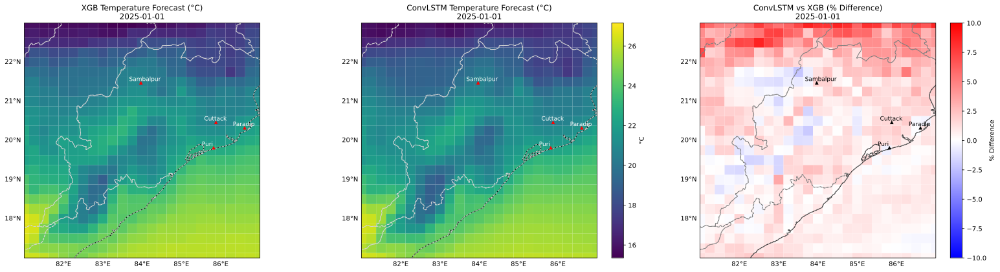

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load Forecast Files
# --------------------------
conv = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_t2m_forecast_2025_01_01.parquet')
xgb  = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet')

# Fix date dtype
conv['date'] = pd.to_datetime(conv['date'])
xgb['date']  = pd.to_datetime(xgb['date'])

# --------------------------
# 2. Select Day
# --------------------------
day = "2025-01-01"
conv_day = conv[conv["date"] == day]
xgb_day  = xgb[xgb["date"] == day]

# --------------------------
# 3. Merge for Differences
# --------------------------
merged = pd.merge(
    xgb_day[["latitude","longitude","t2m_pred"]],
    conv_day[["latitude","longitude","t2m_pred_conv"]],
    on=["latitude","longitude"],
    how="inner"
)

merged["pct_diff"] = 100 * (merged["t2m_pred_conv"] - merged["t2m_pred"]) / merged["t2m_pred"]


# --------------------------
# Helper: Create Grid
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=75, lon_max=90):
    df = df[(df["latitude"] >= lat_min) & (df["latitude"] <= lat_max) &
            (df["longitude"] >= lon_min) & (df["longitude"] <= lon_max)]

    lats = np.sort(df["latitude"].unique())
    lons = np.sort(df["longitude"].unique())

    grid = np.full((len(lats), len(lons)), np.nan)

    for i, la in enumerate(lats):
        for j, lo in enumerate(lons):
            val = df[(df["latitude"] == la) & (df["longitude"] == lo)][metric].values
            if len(val) > 0:
                grid[i, j] = val[0]
    return lats, lons, grid

# --------------------------
# 4. Cities for reference
# --------------------------
cities = {
    "Cuttack": (20.46, 85.88),
    "Paradip": (20.32, 86.61),
    "Puri": (19.81, 85.82),
    "Sambalpur": (21.47, 83.97)
}

# --------------------------
# 5. Plot three-panel map
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(22, 6), subplot_kw={'projection': ccrs.PlateCarree()})

# --------------------------
# Panel 1 – XGB forecast
# --------------------------
ax = axes[0]
lats, lons, grid = create_grid(xgb_day, "t2m_pred")

mesh1 = ax.pcolormesh(lons, lats, grid,
                      shading="auto", cmap="viridis",
                      transform=ccrs.PlateCarree())

ax.set_title(f"XGB Temperature Forecast (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])

ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"), linewidth=1)
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
# cities
for city, (lat, lon) in cities.items():
    ax.plot(lon, lat, marker="^", color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

#cbar1 = fig.colorbar(mesh1, ax=ax, orientation="vertical", pad=0.05, fraction=0.05)
#cbar1.set_label("°C")

# --------------------------
# Panel 2 – ConvLSTM forecast
# --------------------------
ax = axes[1]
lats, lons, grid = create_grid(conv_day, "t2m_pred_conv")

mesh2 = ax.pcolormesh(lons, lats, grid,
                      shading="auto", cmap="viridis",
                      transform=ccrs.PlateCarree())

ax.set_title(f"ConvLSTM Temperature Forecast (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])

ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"), linewidth=1)
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
# cities
for city, (lat, lon) in cities.items():
    ax.plot(lon, lat, marker="^", color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

cbar2 = fig.colorbar(mesh2, ax=ax, orientation="vertical", pad=0.05, fraction=0.05)
cbar2.set_label("°C")


# --------------------------
# Panel 3 – % Difference
# --------------------------
ax = axes[2]
lats, lons, grid = create_grid(merged, "pct_diff")

mesh3 = ax.pcolormesh(
    lons, lats, grid,
    shading="auto",
    cmap="bwr",
    vmin=-10, vmax=10,
    transform=ccrs.PlateCarree()
)

ax.set_title(f"ConvLSTM vs XGB (% Difference)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])

ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"), linewidth=1)
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="grey")
gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
# cities
for city, (lat, lon) in cities.items():
    ax.plot(lon, lat, marker="^", color="black", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="black")

cbar3 = fig.colorbar(mesh3, ax=ax, orientation="vertical", pad=0.05, fraction=0.05)
cbar3.set_label("% Difference")

plt.tight_layout()
plt.show()


---

### Temperature

In [1]:
import xarray as xr 


In [42]:
jant2m = xr.open_dataset('/vol/sandeep_storage/Files2/catastrophe/2025jan_t2m.nc')
jant2m


<xarray.Dataset> Size: 5MB
Dimensions:     (valid_time: 744, latitude: 25, longitude: 61)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 6kB 2025-01-01 ... 2025-01-31T23:...
  * latitude    (latitude) float64 200B 23.0 22.75 22.5 ... 17.5 17.25 17.0
  * longitude   (longitude) float64 488B 75.0 75.25 75.5 ... 89.5 89.75 90.0
    expver      (valid_time) <U4 12kB ...
Data variables:
    t2m         (valid_time, latitude, longitude) float32 5MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-11-16T00:55 GRIB to CDM+CF via cfgrib-0.9.1...

In [4]:
import xarray as xr
import pandas as pd

# ---------------------------
# Load data
# ---------------------------
ds = xr.open_mfdataset('/vol/sandeep_storage/Files2/catastrophe/2025jan_t2m.nc')

# ---------------------------
# Convert time to daily mean
# ---------------------------
# ERA5 is hourly → daily mean
ds_daily = ds.resample(valid_time="1D").mean()

# ---------------------------
# Convert Kelvin → Celsius
# ---------------------------
ds_daily["t2m"] = ds_daily["t2m"] - 273.15

# ---------------------------
# Convert to long-table pandas DF
# Keeps lat, lon, date exactly
# ---------------------------
df = ds_daily["t2m"].to_dataframe().reset_index()

# Ensure proper dtypes
df["valid_time"] = pd.to_datetime(df["valid_time"])

# ---------------------------
# Save as a single Parquet file
# ---------------------------
output_path = "/vol/sandeep_storage/Files2/catastrophe/t2m_daily_jan_2025.parquet"
df.to_parquet(output_path, index=False)

print("Saved daily t2m parquet file to:", output_path)


Saved daily t2m parquet file to: /vol/sandeep_storage/Files2/catastrophe/t2m_daily_jan_2025.parquet


In [5]:
daily_jan=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/t2m_daily_jan_2025.parquet')
daily_jan


,valid_time,latitude,longitude,number,t2m
0,2025-01-01,23.0,75.00,0,17.463318
1,2025-01-01,23.0,75.25,0,16.628845
2,2025-01-01,23.0,75.50,0,16.147644
3,2025-01-01,23.0,75.75,0,15.928986
4,2025-01-01,23.0,76.00,0,15.924835
...,...,...,...,...,...
47270,2025-01-31,17.0,89.00,0,24.978424
47271,2025-01-31,17.0,89.25,0,24.977539
47272,2025-01-31,17.0,89.50,0,24.937317
47273,2025-01-31,17.0,89.75,0,24.895081


In [3]:
jantp = xr.open_dataset('/vol/sandeep_storage/Files2/catastrophe/2025jan_tp.nc')
jantp


<xarray.Dataset> Size: 5MB
Dimensions:     (valid_time: 744, latitude: 25, longitude: 61)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 6kB 2025-01-01 ... 2025-01-31T23:...
  * latitude    (latitude) float64 200B 23.0 22.75 22.5 ... 17.5 17.25 17.0
  * longitude   (longitude) float64 488B 75.0 75.25 75.5 ... 89.5 89.75 90.0
    expver      (valid_time) <U4 12kB ...
Data variables:
    tp          (valid_time, latitude, longitude) float32 5MB ...
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2025-11-16T00:55 GRIB to CDM+CF via cfgrib-0.9.1...

In [4]:
import xarray as xr
import pandas as pd

# ---------------------------
# Load data
# ---------------------------
ds = xr.open_mfdataset('/vol/sandeep_storage/Files2/catastrophe/2025jan_tp.nc')

# ---------------------------
# Convert time to daily mean
# ---------------------------
# ERA5 is hourly → daily mean
ds_daily = ds.resample(valid_time="1D").mean()


# ---------------------------
# Convert to long-table pandas DF
# Keeps lat, lon, date exactly
# ---------------------------
df = ds_daily["tp"].to_dataframe().reset_index()

# Ensure proper dtypes
df["valid_time"] = pd.to_datetime(df["valid_time"])

# ---------------------------
# Save as a single Parquet file
# ---------------------------
output_path = "/vol/sandeep_storage/Files2/catastrophe/tp_daily_jan_2025.parquet"
df.to_parquet(output_path, index=False)

print("Saved daily tp parquet file to:", output_path)


Saved daily tp parquet file to: /vol/sandeep_storage/Files2/catastrophe/tp_daily_jan_2025.parquet


In [5]:
daily_jan_tp=pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/tp_daily_jan_2025.parquet')
daily_jan_tp


,valid_time,latitude,longitude,number,tp
0,2025-01-01,23.0,75.00,0,0.000000e+00
1,2025-01-01,23.0,75.25,0,0.000000e+00
2,2025-01-01,23.0,75.50,0,0.000000e+00
3,2025-01-01,23.0,75.75,0,0.000000e+00
4,2025-01-01,23.0,76.00,0,0.000000e+00
...,...,...,...,...,...
47270,2025-01-31,17.0,89.00,0,0.000000e+00
47271,2025-01-31,17.0,89.25,0,1.390775e-07
47272,2025-01-31,17.0,89.50,0,5.761783e-07
47273,2025-01-31,17.0,89.75,0,9.139379e-07


### Forecasting skills 

### temperature 

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load Forecast Files
# --------------------------
conv = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_t2m_forecast_2025_01_01.parquet')
xgb  = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet')

# Actual ERA5
era5 = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/t2m_daily_jan_2025.parquet')
era5_1jan = era5.rename(columns={'valid_time':'date','t2m': 't2m_actual'})

# Fix dates
conv['date'] = pd.to_datetime(conv['date'])
xgb['date']  = pd.to_datetime(xgb['date'])
era5_1jan['date'] = pd.to_datetime(era5_1jan['date'])

# --------------------------
# 2. Select Day
# --------------------------
day = "2025-01-01"
conv_day = conv[conv["date"] == day]
xgb_day  = xgb[xgb["date"] == day]
era_day  = era5_1jan[era5_1jan['date'] == day]

# --------------------------
# 3. Merge for AE difference
# --------------------------
merged = (
    xgb_day[["latitude","longitude","t2m_pred"]]
    .merge(conv_day[["latitude","longitude","t2m_pred_conv"]],
           on=["latitude","longitude"], how="inner")
    .merge(era_day[["latitude","longitude","t2m_actual"]],
           on=["latitude","longitude"], how="inner")
)

merged['AE_conv'] = np.abs(merged['t2m_pred_conv'] - merged['t2m_actual'])
merged['AE_xgb']  = np.abs(merged['t2m_pred'] - merged['t2m_actual'])
merged['AE_diff'] = merged['AE_conv'] - merged['AE_xgb']

# --------------------------
# Helper to make grid
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=75, lon_max=90):
    df = df[(df["latitude"] >= lat_min) & (df["latitude"] <= lat_max) &
            (df["longitude"] >= lon_min) & (df["longitude"] <= lon_max)]

    lats = np.sort(df["latitude"].unique())
    lons = np.sort(df["longitude"].unique())
    grid = np.full((len(lats), len(lons)), np.nan)

    for i, la in enumerate(lats):
        for j, lo in enumerate(lons):
            v = df[(df["latitude"] == la) & (df["longitude"] == lo)][metric].values
            if len(v) > 0:
                grid[i, j] = v[0]
    return lats, lons, grid

# --------------------------
# Cities
# --------------------------
cities = {
    "Cuttack": (20.46, 85.88),
    "Paradip": (20.32, 86.61),
    "Puri": (19.81, 85.82),
    "Sambalpur": (21.47, 83.97)
}

# --------------------------
# 4-Panel Figure
# --------------------------
fig, axes = plt.subplots(1, 4, figsize=(23, 6),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Force longitude ticks everywhere
xticks = np.arange(81, 88, 1)
for ax in axes:
    ax.set_xticks(xticks)
    ax.tick_params(labelbottom=True, labelsize=9)

# Remove y-ticks from panels 2–4
for ax in axes[1:]:
    ax.set_yticks([])
    ax.set_ylabel("")

# --------------------------
# Panel 1 – Actual
# --------------------------
ax = axes[0]
lats, lons, grid = create_grid(era_day, "t2m_actual")
mesh1 = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"Actual Temperature (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False; gl.right_labels = False
gl.bottom_labels = False
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 2 – XGB
# --------------------------
ax = axes[1]
lats, lons, grid = create_grid(xgb_day, "t2m_pred")
mesh_xgb = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"XGB Forecast (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")
# --------------------------
# Panel 3 – ConvLSTM
# --------------------------
ax = axes[2]
lats, lons, grid = create_grid(conv_day, "t2m_pred_conv")
mesh2 = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"ConvLSTM Forecast (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")
# --------------------------
# Panel 4 – AE Difference
# --------------------------
ax = axes[3]
lats, lons, grid = create_grid(merged, "AE_diff")
mesh3 = ax.pcolormesh(lons, lats, grid, cmap="bwr", vmin=-3, vmax=3, shading="auto")

ax.set_title(f"AE Difference (ConvLSTM − XGB)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="grey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="brown", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="black")
# --------------------------
# COLORBARS — Clean and Cohesive
# --------------------------

# Temperature colorbar on LEFT
cax1 = fig.add_axes([0.035, 0.25, 0.015, 0.50])   # LEFT side
cbar2 = plt.colorbar(mesh2, cax=cax1)
cbar2.set_label("Temperature (°C)", rotation=90, labelpad=10)
cax1.yaxis.set_label_position("left")
cax1.yaxis.tick_left()

# AE Difference colorbar on RIGHT
cax2 = fig.add_axes([0.95, 0.25, 0.015, 0.50])
cbar3 = plt.colorbar(mesh3, cax=cax2)
cbar3.set_label("AE Difference (°C)", rotation=90, labelpad=10)

plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])
save_path = '/vol/sandeep_storage/Files2/catastrophe/t2m_forecast_xgb_vs_convlstm_2025_01_01.png'
plt.savefig(save_path)
plt.show()


/tmp/ipykernel_251984/1565055909.py:179: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])


----

### Precipitation

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load Forecast Files
# --------------------------
conv = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_tp_forecast_2025_01_01.parquet')
xgb  = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/tp_xgb_forecast_2025_01_01.parquet')

# Actual ERA5
era5 = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/tp_daily_jan_2025.parquet')
era5_1jan = era5.rename(columns={'valid_time':'date','tp': 'tp_actual'})

# Fix dates
conv['date'] = pd.to_datetime(conv['date'])
xgb['date']  = pd.to_datetime(xgb['date'])
era5_1jan['date'] = pd.to_datetime(era5_1jan['date'])

# --------------------------
# 2. Select Day
# --------------------------
day = "2025-01-01"
conv_day = conv[conv["date"] == day]
xgb_day  = xgb[xgb["date"] == day]
era_day  = era5_1jan[era5_1jan['date'] == day]

# --------------------------
# 3. Merge for AE difference
# --------------------------
merged = (
    xgb_day[["latitude","longitude","tp_pred"]]
    .merge(conv_day[["latitude","longitude","tp_pred_conv"]],
           on=["latitude","longitude"], how="inner")
    .merge(era_day[["latitude","longitude","tp_actual"]],
           on=["latitude","longitude"], how="inner")
)

merged['AE_conv'] = np.abs(merged['tp_pred_conv'] - merged['tp_actual'])
merged['AE_xgb']  = np.abs(merged['tp_pred'] - merged['tp_actual'])
merged['AE_diff'] = merged['AE_conv'] - merged['AE_xgb']

# --------------------------
# Helper to make grid
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=75, lon_max=90):
    df = df[(df["latitude"] >= lat_min) & (df["latitude"] <= lat_max) &
            (df["longitude"] >= lon_min) & (df["longitude"] <= lon_max)]

    lats = np.sort(df["latitude"].unique())
    lons = np.sort(df["longitude"].unique())
    grid = np.full((len(lats), len(lons)), np.nan)

    for i, la in enumerate(lats):
        for j, lo in enumerate(lons):
            v = df[(df["latitude"] == la) & (df["longitude"] == lo)][metric].values
            if len(v) > 0:
                grid[i, j] = v[0]
    return lats, lons, grid

# --------------------------
# Cities
# --------------------------
cities = {
    "Cuttack": (20.46, 85.88),
    "Paradip": (20.32, 86.61),
    "Puri": (19.81, 85.82),
    "Sambalpur": (21.47, 83.97)
}

# --------------------------
# 4-Panel Figure
# --------------------------
fig, axes = plt.subplots(1, 4, figsize=(23, 6),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Force longitude ticks everywhere
xticks = np.arange(81, 88, 1)
for ax in axes:
    ax.set_xticks(xticks)
    ax.tick_params(labelbottom=True, labelsize=9)

# Remove y-ticks from panels 2–4
for ax in axes[1:]:
    ax.set_yticks([])
    ax.set_ylabel("")

# --------------------------
# Panel 1 – Actual
# --------------------------
ax = axes[0]
lats, lons, grid = create_grid(era_day, "tp_actual")
mesh1 = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"Actual Precipitation (m)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False; gl.right_labels = False
gl.bottom_labels = False
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 2 – XGB
# --------------------------
ax = axes[1]
lats, lons, grid = create_grid(xgb_day, "tp_pred")
mesh_xgb = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"XGB Forecast (m)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")
# --------------------------
# Panel 3 – ConvLSTM
# --------------------------
ax = axes[2]
lats, lons, grid = create_grid(conv_day, "tp_pred_conv")
mesh2 = ax.pcolormesh(lons, lats, grid, cmap="viridis", shading="auto")

ax.set_title(f"ConvLSTM Forecast (m)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")
# --------------------------
# Panel 4 – AE Difference
# --------------------------
ax = axes[3]
lats, lons, grid = create_grid(merged, "AE_diff")
mesh3 = ax.pcolormesh(lons, lats, grid, cmap="bwr", vmin=-0.0001, vmax=0.0001, shading="auto")

ax.set_title(f"AE Difference (ConvLSTM − XGB)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="grey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="brown", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="black")
# --------------------------
# COLORBARS — Clean and Cohesive
# --------------------------

# Temperature colorbar on LEFT
cax1 = fig.add_axes([0.035, 0.25, 0.015, 0.50])   # LEFT side
cbar2 = plt.colorbar(mesh2, cax=cax1)
cbar2.set_label("Precipitation (m)", rotation=90, labelpad=10)
cax1.yaxis.set_label_position("left")
cax1.yaxis.tick_left()

# AE Difference colorbar on RIGHT
cax2 = fig.add_axes([0.95, 0.25, 0.015, 0.50])
cbar3 = plt.colorbar(mesh3, cax=cax2)
cbar3.set_label("AE Difference (m)", rotation=90, labelpad=10)

plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])
save_path = '/vol/sandeep_storage/Files2/catastrophe/tp_forecast_xgb_vs_convlstm_2025_01_01.png'
plt.savefig(save_path)
plt.show()


/tmp/ipykernel_251984/2863270505.py:179: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])


In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load Forecast Files
# --------------------------
conv = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_tp_forecast_2025_01_01.parquet')
xgb  = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/tp_xgb_forecast_2025_01_01.parquet')

# Actual ERA5
era5 = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/tp_daily_jan_2025.parquet')
era5_1jan = era5.rename(columns={'valid_time':'date','tp': 'tp_actual'})

# Fix dates
conv['date'] = pd.to_datetime(conv['date'])
xgb['date']  = pd.to_datetime(xgb['date'])
era5_1jan['date'] = pd.to_datetime(era5_1jan['date'])

# --------------------------
# 2. Select Day
# --------------------------
day = "2025-01-01"
conv_day = conv[conv["date"] == day]
xgb_day  = xgb[xgb["date"] == day]
era_day  = era5_1jan[era5_1jan['date'] == day]

# --------------------------
# 3. Merge for AE difference
# --------------------------
merged = (
    xgb_day[["latitude","longitude","tp_pred"]]
    .merge(conv_day[["latitude","longitude","tp_pred_conv"]],
           on=["latitude","longitude"], how="inner")
    .merge(era_day[["latitude","longitude","tp_actual"]],
           on=["latitude","longitude"], how="inner")
)

merged['AE_conv'] = np.abs(merged['tp_pred_conv'] - merged['tp_actual'])
merged['AE_xgb']  = np.abs(merged['tp_pred'] - merged['tp_actual'])
merged['AE_diff'] = merged['AE_conv'] - merged['AE_xgb']

# --------------------------
# Helper to make grid
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=75, lon_max=90):
    df = df[(df["latitude"] >= lat_min) & (df["latitude"] <= lat_max) &
            (df["longitude"] >= lon_min) & (df["longitude"] <= lon_max)]

    lats = np.sort(df["latitude"].unique())
    lons = np.sort(df["longitude"].unique())
    grid = np.full((len(lats), len(lons)), np.nan)

    for i, la in enumerate(lats):
        for j, lo in enumerate(lons):
            v = df[(df["latitude"] == la) & (df["longitude"] == lo)][metric].values
            if len(v) > 0:
                grid[i, j] = v[0]
    return lats, lons, grid

# --------------------------
# Cities
# --------------------------
cities = {
    "Cuttack": (20.46, 85.88),
    "Paradip": (20.32, 86.61),
    "Puri": (19.81, 85.82),
    "Sambalpur": (21.47, 83.97)
}

# --------------------------
# 4-Panel Figure (values in mm)
# --------------------------
fig, axes = plt.subplots(1, 4, figsize=(23, 6),
                         subplot_kw={'projection': ccrs.PlateCarree()})

# Force longitude ticks everywhere
xticks = np.arange(81, 88, 1)
for ax in axes:
    ax.set_xticks(xticks)
    ax.tick_params(labelbottom=True, labelsize=9)

# Remove y-ticks from panels 2–4
for ax in axes[1:]:
    ax.set_yticks([])
    ax.set_ylabel("")

# --------------------------
# Panel 1 – Actual
# --------------------------
ax = axes[0]
lats, lons, grid = create_grid(era_day, "tp_actual")
grid_mm = grid * 1000  # Convert to mm
mesh1 = ax.pcolormesh(lons, lats, grid_mm, cmap="viridis", shading="auto")

ax.set_title(f"Actual Precipitation (mm)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=True, linewidth=0.3, alpha=0)
gl.top_labels = False; gl.right_labels = False
gl.bottom_labels = False
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 2 – XGB
# --------------------------
ax = axes[1]
lats, lons, grid = create_grid(xgb_day, "tp_pred")
grid_mm = grid * 1000
mesh_xgb = ax.pcolormesh(lons, lats, grid_mm, cmap="viridis", shading="auto")

ax.set_title(f"XGB Forecast (mm)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 3 – ConvLSTM
# --------------------------
ax = axes[2]
lats, lons, grid = create_grid(conv_day, "tp_pred_conv")
grid_mm = grid * 1000
mesh2 = ax.pcolormesh(lons, lats, grid_mm, cmap="viridis", shading="auto")

ax.set_title(f"ConvLSTM Forecast (mm)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 4 – AE Difference
# --------------------------
ax = axes[3]
lats, lons, grid = create_grid(merged, "AE_diff")
grid_mm = grid * 1000
mesh3 = ax.pcolormesh(lons, lats, grid_mm, cmap="bwr", vmin=-0.1, vmax=0.1, shading="auto")

ax.set_title(f"AE Difference (ConvLSTM − XGB) (mm)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="grey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="brown", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="black")

# --------------------------
# COLORBARS — Clean and Cohesive
# --------------------------
# Precipitation colorbar on LEFT
cax1 = fig.add_axes([0.035, 0.25, 0.015, 0.50])   # LEFT side
cbar2 = plt.colorbar(mesh2, cax=cax1)
cbar2.set_label("Precipitation (mm)", rotation=90, labelpad=10)
cax1.yaxis.set_label_position("left")
cax1.yaxis.tick_left()

# AE Difference colorbar on RIGHT
cax2 = fig.add_axes([0.95, 0.25, 0.015, 0.50])
cbar3 = plt.colorbar(mesh3, cax=cax2)
cbar3.set_label("AE Difference (mm)", rotation=90, labelpad=10)

plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])
save_path = '/vol/sandeep_storage/Files2/catastrophe/tp_forecast_xgb_vs_convlstm_mm_2025_01_01.png'
plt.savefig(save_path)
plt.show()

print(f"Saved TP forecast & AE figure in mm: {save_path}")


/tmp/ipykernel_251984/4086279290.py:185: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0, 0.93, 1.0])


Saved TP forecast & AE figure in mm: /vol/sandeep_storage/Files2/catastrophe/tp_forecast_xgb_vs_convlstm_mm_2025_01_01.png


---

/tmp/ipykernel_251984/71415816.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.02, 0, 0.92, 1.0])


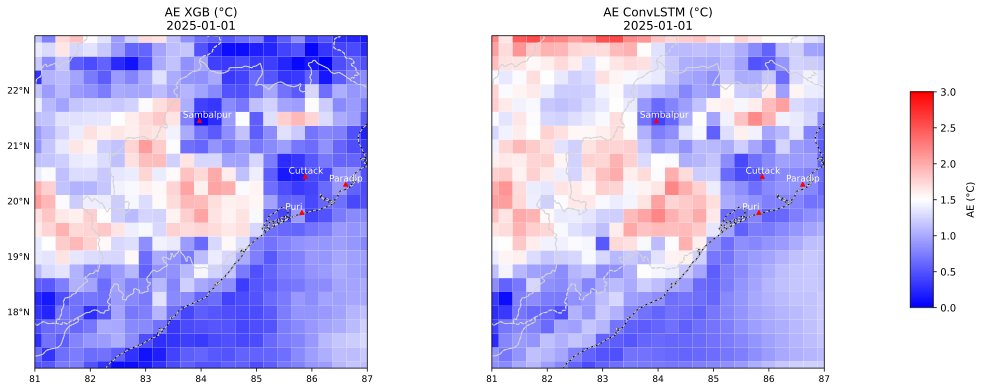

Saved 2-panel AE figure with closer plots: /vol/sandeep_storage/Files2/catastrophe/t2m_forecast_ae_two_panels_2025_01_01.png


In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

# --------------------------
# 1. Load Forecast Files
# --------------------------
conv = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/convlstm/convlstm_t2m_forecast_2025_01_01.parquet')
xgb  = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/xgb_outputs/xgb_forecast_2025_01_01.parquet')
era5 = pd.read_parquet('/vol/sandeep_storage/Files2/catastrophe/t2m_daily_jan_2025.parquet')
era5_1jan = era5.rename(columns={'valid_time':'date','t2m': 't2m_actual'})

# --------------------------
# 2. Fix dates
# --------------------------
conv['date'] = pd.to_datetime(conv['date'])
xgb['date']  = pd.to_datetime(xgb['date'])
era5_1jan['date'] = pd.to_datetime(era5_1jan['date'])

# --------------------------
# 3. Select Day
# --------------------------
day = "2025-01-01"
conv_day = conv[conv["date"] == day]
xgb_day  = xgb[xgb["date"] == day]
era_day  = era5_1jan[era5_1jan['date'] == day]

# --------------------------
# 4. Merge for AE difference
# --------------------------
merged = (
    xgb_day[["latitude","longitude","t2m_pred"]]
    .merge(conv_day[["latitude","longitude","t2m_pred_conv"]],
           on=["latitude","longitude"], how="inner")
    .merge(era_day[["latitude","longitude","t2m_actual"]],
           on=["latitude","longitude"], how="inner")
)

merged['AE_conv'] = np.abs(merged['t2m_pred_conv'] - merged['t2m_actual'])
merged['AE_xgb']  = np.abs(merged['t2m_pred'] - merged['t2m_actual'])

# --------------------------
# 5. Helper to make grid
# --------------------------
def create_grid(df, metric, lat_min=17, lat_max=23, lon_min=75, lon_max=90):
    df = df[(df["latitude"] >= lat_min) & (df["latitude"] <= lat_max) &
            (df["longitude"] >= lon_min) & (df["longitude"] <= lon_max)]

    lats = np.sort(df["latitude"].unique())
    lons = np.sort(df["longitude"].unique())
    grid = np.full((len(lats), len(lons)), np.nan)

    for i, la in enumerate(lats):
        for j, lo in enumerate(lons):
            v = df[(df["latitude"] == la) & (df["longitude"] == lo)][metric].values
            if len(v) > 0:
                grid[i, j] = v[0]
    return lats, lons, grid

# --------------------------
# 6. Cities
# --------------------------
cities = {
    "Cuttack": (20.46, 85.88),
    "Paradip": (20.32, 86.61),
    "Puri": (19.81, 85.82),
    "Sambalpur": (21.47, 83.97)
}

# --------------------------
# 7. Compute consistent color scale for AE plots
# --------------------------
ae_min = np.floor(merged[['AE_xgb','AE_conv']].min().min())
ae_max = np.ceil(merged[['AE_xgb','AE_conv']].max().max())

# --------------------------
# 8. 2-Panel AE Figure
# --------------------------
fig, axes = plt.subplots(1, 2, figsize=(16, 6),
                         subplot_kw={'projection': ccrs.PlateCarree()},
                         gridspec_kw={'wspace': 0.05})  # smaller space between plots

# Force longitude ticks everywhere
xticks = np.arange(81, 88, 1)
for ax in axes:
    ax.set_xticks(xticks)
    ax.tick_params(labelbottom=True, labelsize=9)

# Remove y-ticks from second panel
axes[1].set_yticks([])
axes[1].set_ylabel("")

# --------------------------
# Panel 1 – AE XGB
# --------------------------
ax = axes[0]
lats, lons, grid = create_grid(merged, "AE_xgb")
mesh1 = ax.pcolormesh(lons, lats, grid, cmap="bwr", shading="auto", vmin=ae_min, vmax=ae_max)

ax.set_title(f"AE XGB (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

# Correct gridlines (no duplicate labels)
gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = False
gl.left_labels = True
gl.xlabel_style = {'size': 9}
gl.ylabel_style = {'size': 9}

# Cities
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# Panel 2 – AE ConvLSTM
# --------------------------
ax = axes[1]
lats, lons, grid = create_grid(merged, "AE_conv")
mesh2 = ax.pcolormesh(lons, lats, grid, cmap="bwr", shading="auto", vmin=ae_min, vmax=ae_max)

ax.set_title(f"AE ConvLSTM (°C)\n{day}", fontsize=12)
ax.set_extent([81,87,17,23])
ax.add_feature(cfeature.COASTLINE.with_scale("10m"))
ax.add_feature(cfeature.BORDERS.with_scale("10m"))
ax.add_feature(cfeature.STATES.with_scale("10m"), linestyle="--", edgecolor="lightgrey")

gl = ax.gridlines(draw_labels=False, linewidth=0.3, alpha=0)

# Cities
for city,(lat,lon) in cities.items():
    ax.plot(lon, lat, '^', color="red", markersize=4)
    ax.text(lon - 0.3, lat + 0.05, city, fontsize=9, color="white")

# --------------------------
# 9. COLORBAR
# --------------------------
# Single colorbar for AE (shared)
cax = fig.add_axes([0.93, 0.25, 0.02, 0.50])
cbar = plt.colorbar(mesh2, cax=cax)
cbar.set_label("AE (°C)", rotation=90, labelpad=10)

plt.tight_layout(rect=[0.02, 0, 0.92, 1.0])
save_path = '/vol/sandeep_storage/Files2/catastrophe/t2m_forecast_ae_two_panels_2025_01_01.png'
plt.savefig(save_path)
plt.show()
print(f"Saved 2-panel AE figure with closer plots: {save_path}")
